In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys

print("at directory:", os.getcwd())
print("changing to root directory")
os.chdir("..")
print("at directory:", os.getcwd())
sys.path.append("simulations")

at directory: /Users/wilka/git/research/temp/multitask_preplay_temp/figures
changing to root directory
at directory: /Users/wilka/git/research/temp/multitask_preplay_temp


In [3]:
from experiments.craftax.craftax_fullmap_renderer import TEXTURES

Loading Craftax textures from cache.
Textures successfully loaded from cache.
Loading textures from cache.
Textures successfully loaded from cache.


In [10]:
from craftax_cogsci_envs import (
  make_craftax_env,
  visualize_simplified_block_config,
  save_figure,
)
import craftax_experiment_configs
from craftax.craftax.constants import BlockType

In [11]:
jax_env = make_craftax_env()

In [12]:
def get_block_locations(world_seed, blocks, state=None):
  for block in blocks:
    if state is None:
      params = default_params.replace(
        world_seeds=(world_seed,),
      )
      obs, state = jax_env.reset(key, params)
    locations = craftax_utils.get_object_positions(state, block)
    print(f"{block.name} locations: {locations}")

In [20]:
i = 2
fig1, fig2 = visualize_simplified_block_config(
  craftax_experiment_configs.PATHS_CONFIGS[i], jax_env
)
save_figure(fig1, f"{i}_fullmap")
save_figure(fig2, f"{i}_agentmap")

(0.33725490196078434, 0.7058823529411765, 0.9137254901960784) red
Loading path from cache: craftax_cache/paths/world_20_path_(18, 30)_(13, 13).npy
Loading path from cache: craftax_cache/paths/world_20_path_(18, 30)_(40, 32).npy
Loading path from cache: craftax_cache/paths/world_20_path_(18, 30)_(42, 30).npy
Saved to craftax_cache/world_20_paths.png
Saved figure to /Users/wilka/git/research/preplay_results/craftax_env_figures/2_fullmap.pdf
Saved figure to /Users/wilka/git/research/preplay_results/craftax_env_figures/2_agentmap.pdf


DIAMOND locations: [[37 47]]
CRAFTING_TABLE locations: [[38 42]
 [42 46]]
IRON locations: [[38 20]
 [35 13]
 [ 7 20]
 [12 39]
 [40 39]
 [40  7]
 [ 6  2]
 [ 4  3]
 [ 1  4]]
Loading path from cache: craftax_cache/paths/world_3_path_(28, 25)_(35, 13).npy
Loading path from cache: craftax_cache/paths/world_3_path_(28, 25)_(37, 47).npy
Loading path from cache: craftax_cache/paths/world_3_path_(28, 25)_(39, 44).npy
Saved to craftax_cache/single/world_3_paths.png


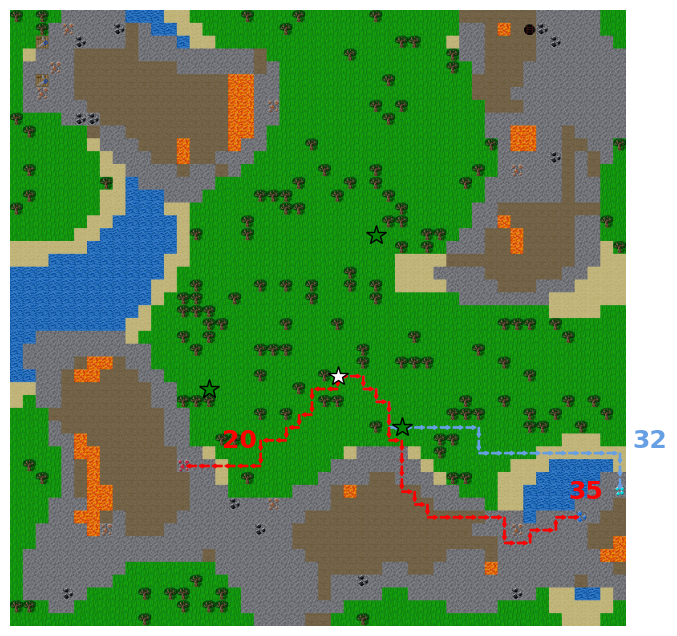

In [59]:
world_seed = 3
start_position = (28, 25)

get_block_locations(
  world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE, BlockType.IRON]
)
train_object = BlockType.SAPPHIRE
train_object_location = (39, 44)  # replacing old diamond location

train_distractor_object = BlockType.RUBY
train_distractor_object_location = (35, 13)

test_object = BlockType.DIAMOND
test_object_location = (37, 47)


craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=train_object,
  train_distractor_object=train_distractor_object,
  test_object=test_object,
  train_object_location=train_object_location,
  train_distractor_object_location=train_distractor_object_location,
  test_object_location=test_object_location,
  prefix="single",
  extra_start_positions_rng=jax.random.PRNGKey(42),
  extra_start_position_center=(20, 24),
  extra_positions=[(32, 30), (17, 28), (29, 15)],
  # extra_start_positions=3,
)
# get_block_locations(
#     world_seed,
#     blocks=[BlockType.DIAMOND, BlockType.SAPPHIRE, BlockType.RUBY],
#     state=state,
#     )

DIAMOND locations: [[42 45]]
CRAFTING_TABLE locations: [[38 46]
 [45 46]]
IRON locations: [[23 13]
 [10 31]
 [44 38]
 [46 36]
 [47 40]]
Loading path from cache: craftax_cache/paths/world_15_path_(24, 24)_(37, 13).npy
Loading path from cache: craftax_cache/paths/world_15_path_(24, 24)_(38, 46).npy
Loading path from cache: craftax_cache/paths/world_15_path_(24, 24)_(41, 44).npy
Saved to craftax_cache/single/world_15_paths.png


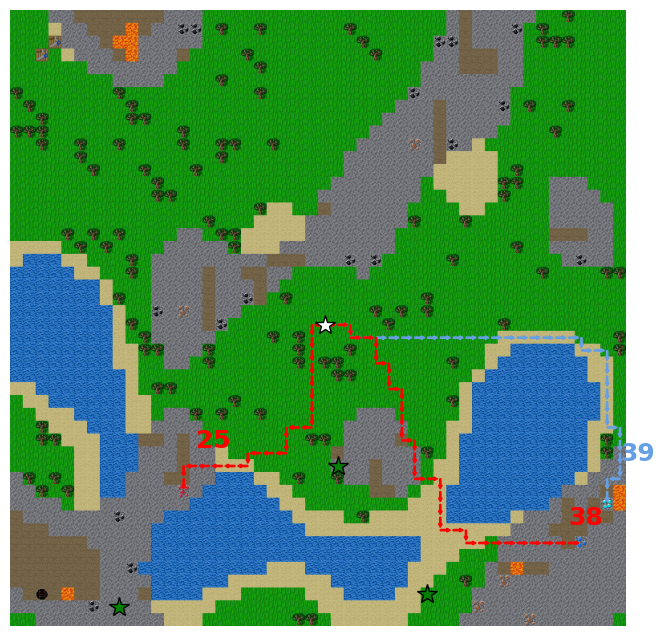

In [61]:
world_seed = 15
# start_position=(22, 25)
start_position = None
get_block_locations(
  world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE, BlockType.IRON]
)
train_object = BlockType.SAPPHIRE
train_object_location = (41, 44)  # replacing old diamond location

train_distractor_object = BlockType.RUBY
train_distractor_object_location = (37, 13)

test_object = BlockType.DIAMOND
test_object_location = (38, 46)


craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=train_object,
  train_distractor_object=train_distractor_object,
  test_object=test_object,
  train_object_location=train_object_location,
  train_distractor_object_location=train_distractor_object_location,
  test_object_location=test_object_location,
  prefix="single",
  extra_start_positions_rng=jax.random.PRNGKey(42),
  extra_start_position_center=(20, 25),
  extra_positions=craftax_experiment_configs.PATHS_CONFIGS[1].start_train_positions,
)
# get_block_locations(
#     world_seed,
#     blocks=[BlockType.DIAMOND, BlockType.SAPPHIRE, BlockType.RUBY],
#     state=state,
#     )

In [9]:
world_seed = 20
start_position = (18, 30)
# start_position = None
get_block_locations(
  world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE, BlockType.IRON]
)
train_object = BlockType.SAPPHIRE
train_object_location = (42, 30)  # replacing old diamond location

train_distractor_object = BlockType.RUBY
train_distractor_object_location = (13, 13)

test_object = BlockType.DIAMOND
test_object_location = (40, 32)


craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=train_object,
  train_distractor_object=train_distractor_object,
  test_object=test_object,
  train_object_location=train_object_location,
  train_distractor_object_location=train_distractor_object_location,
  test_object_location=test_object_location,
  prefix="single",
  extra_start_positions_rng=jax.random.PRNGKey(42),
  extra_start_position_center=(20, 25),
  extra_positions=craftax_experiment_configs.PATHS_CONFIGS[2].start_train_positions,
)
# get_block_locations(
#     world_seed,
#     blocks=[BlockType.DIAMOND, BlockType.SAPPHIRE, BlockType.RUBY],
#     state=state,
#     )

NameError: name 'default_params' is not defined

DIAMOND locations: [[ 3 36]]
CRAFTING_TABLE locations: [[ 6 34]
 [ 6 38]]
IRON locations: [[26 40]
 [ 8 29]
 [28 41]
 [23 42]
 [24 45]
 [ 4 33]
 [14 44]
 [28 46]
 [ 2 40]]
Loading path from cache: craftax_cache/paths/world_95_path_(7, 16)_(17, 13).npy
Loading path from cache: craftax_cache/paths/world_95_path_(7, 16)_(6, 34).npy
Loading path from cache: craftax_cache/paths/world_95_path_(7, 16)_(3, 36).npy
Saved to craftax_cache/single/world_95_paths.png


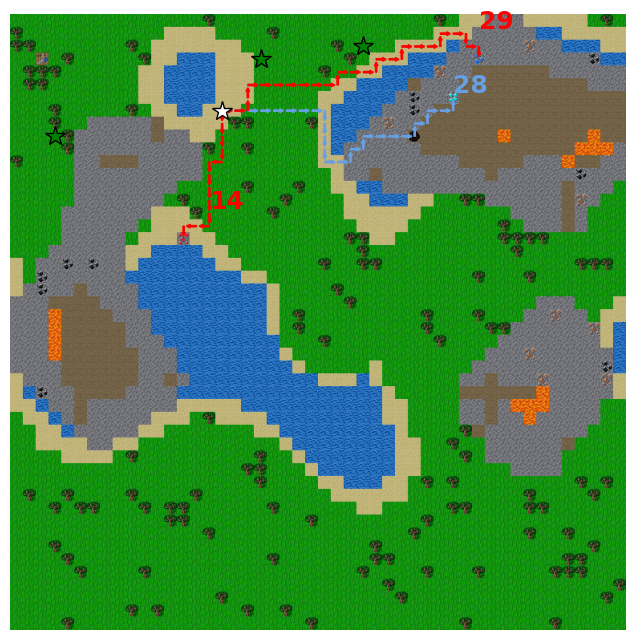

In [67]:
world_seed = 95
start_position = (7, 16)

get_block_locations(
  world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE, BlockType.IRON]
)
train_object = BlockType.SAPPHIRE
train_object_location = (3, 36)  # replacing old diamond location

train_distractor_object = BlockType.RUBY
train_distractor_object_location = (17, 13)

test_object = BlockType.DIAMOND
test_object_location = (6, 34)


craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=train_object,
  train_distractor_object=train_distractor_object,
  test_object=test_object,
  train_object_location=train_object_location,
  train_distractor_object_location=train_distractor_object_location,
  test_object_location=test_object_location,
  prefix="single",
  extra_start_positions_rng=jax.random.PRNGKey(42),
  extra_start_position_center=(20, 25),
  extra_positions=craftax_experiment_configs.PATHS_CONFIGS[3].start_train_positions,
)
# get_block_locations(
#     world_seed,
#     blocks=[BlockType.DIAMOND, BlockType.SAPPHIRE, BlockType.RUBY],
#     state=state,
#     )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/paths/world_2_path_(34, 10)_(34, 27).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/paths/world_2_path_(34, 10)_(41, 29).npy
path length: 18
path length: 27
Loading path from cache: craftax_cache/paths/world_2_path_(34, 10)_(41, 8).npy
Loading path from cache: craftax_cache/paths/world_2_path_(34, 10)_(37, 28).npy
path length: 20
path length: 24
Saved to craftax_cache/double/world_2_paths.png


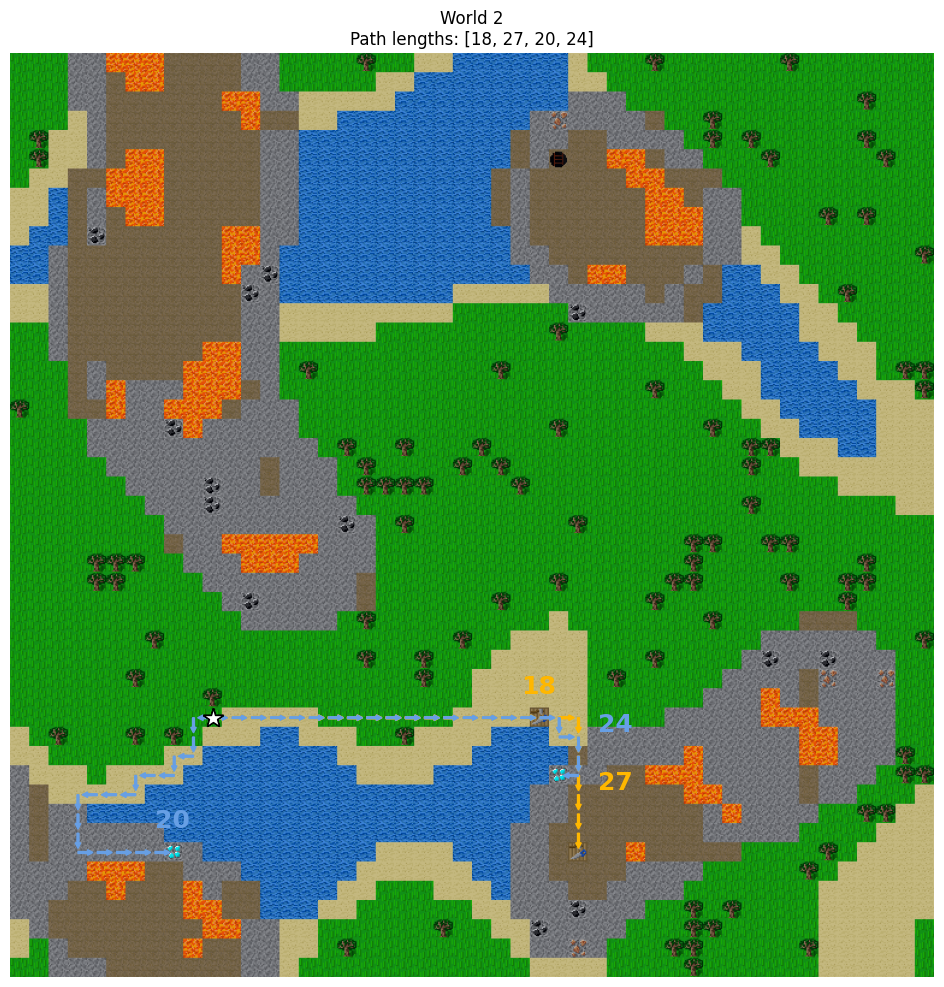

In [40]:
world_seed = 2
start_position = (34, 10)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env=jax_env,
    params=default_params,
    world_seed=world_seed,
    start_position=start_position,
    train_object=BlockType.CRAFTING_TABLE,
    test_object=BlockType.DIAMOND,
    prefix="double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_2_path_(46, 18)_(41, 29).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_2_path_(46, 18)_(34, 27).npy
path length: 17
path length: 26


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_2_path_(46, 18)_(41, 8).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_2_path_(46, 18)_(37, 28).npy
path length: 16
path length: 20
Saved to craftax_cache/0double/world_2_paths.png


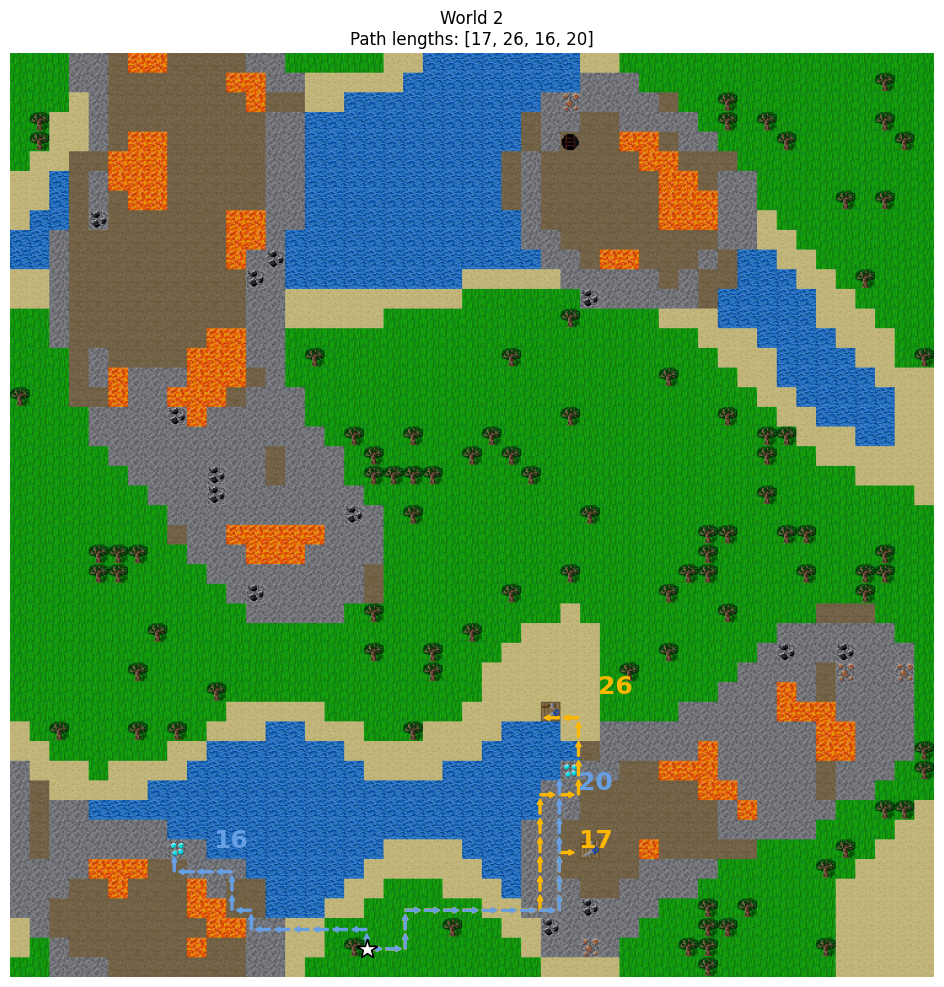

In [125]:
world_seed = 2
start_position = (46, 18)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

In [80]:
world_seed = 13
start_position = (14, 5)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

NameError: name 'params' is not defined

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_16_path_(46, 26)_(18, 23).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_16_path_(46, 26)_(18, 18).npy
path length: 32
path length: 37


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_16_path_(46, 26)_(21, 35).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_16_path_(46, 26)_(14, 21).npy
path length: 35
path length: 38
Saved to craftax_cache/0double/world_16_paths.png


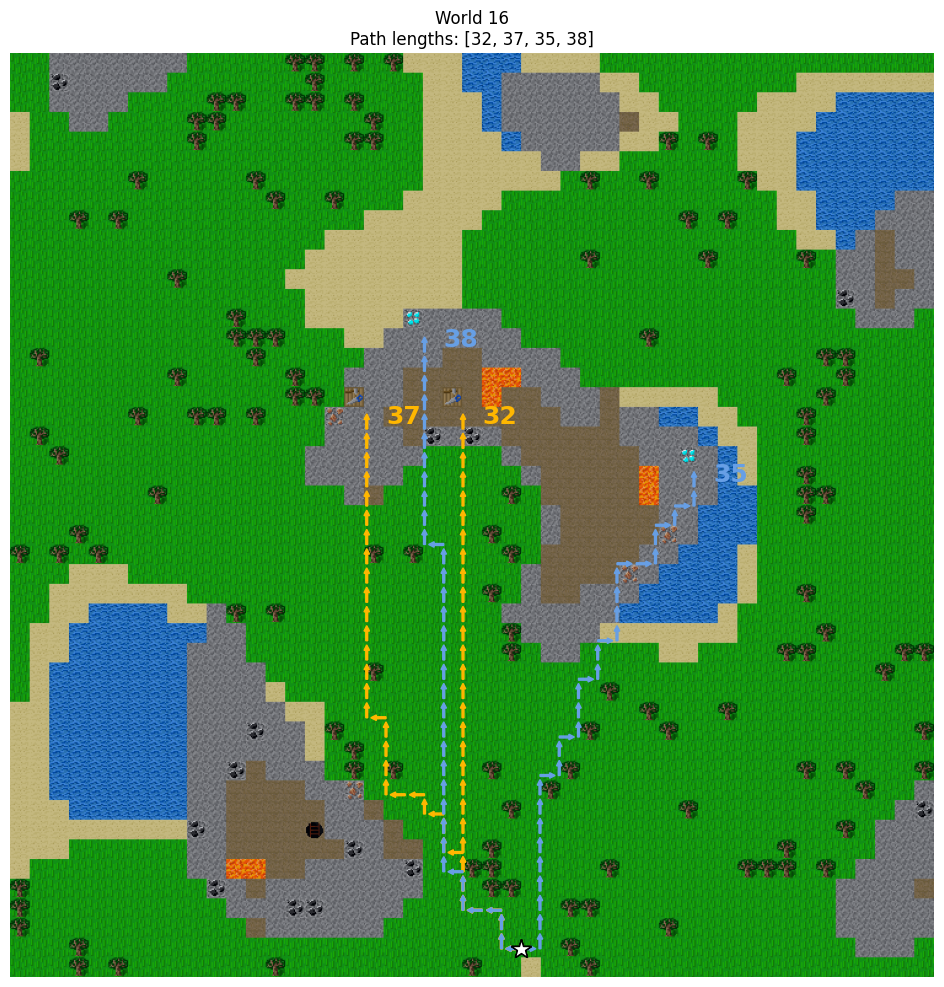

In [134]:
world_seed = 16
start_position = (46, 26)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_21_path_(25, 24)_(12, 36).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_21_path_(25, 24)_(19, 43).npy
path length: 26
path length: 26


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_21_path_(25, 24)_(32, 38).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_21_path_(25, 24)_(16, 39).npy
path length: 22
path length: 25
Saved to craftax_cache/0double/world_21_paths.png


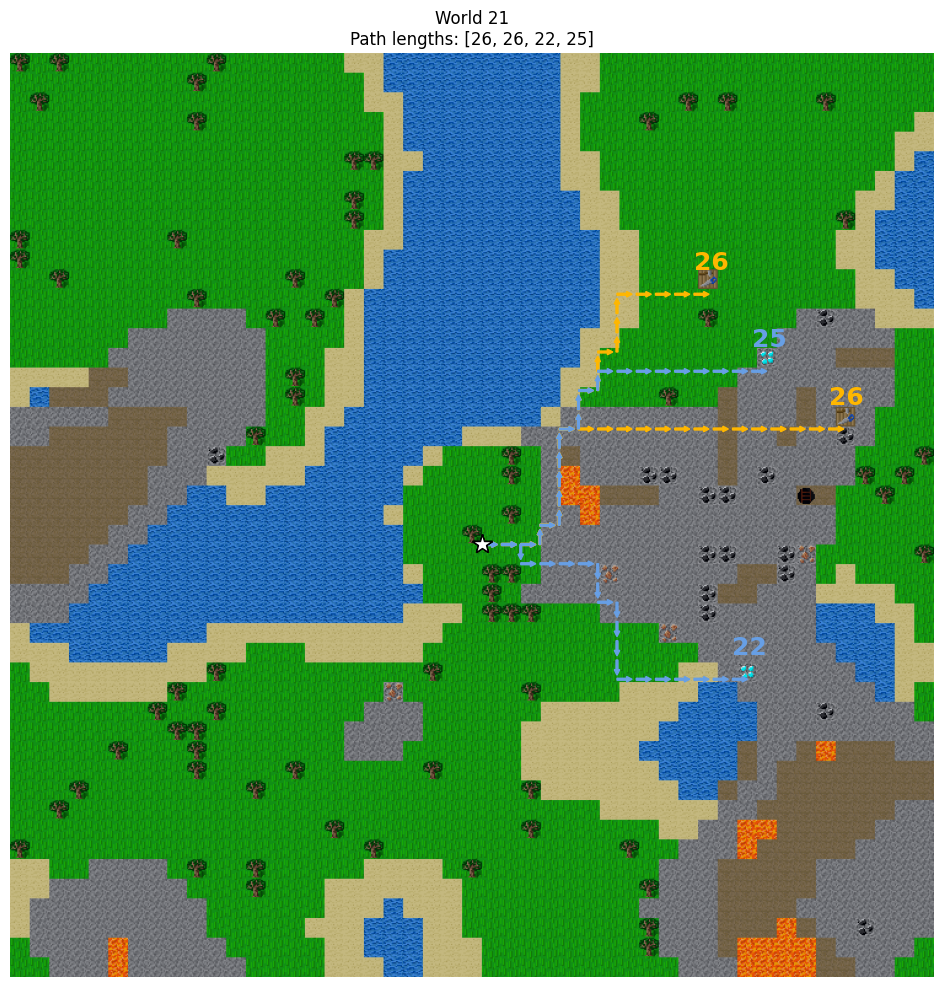

In [136]:
world_seed = 21
start_position = (25, 24)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_38_path_(38, 24)_(20, 28).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_38_path_(38, 24)_(22, 36).npy
path length: 23
path length: 29


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_38_path_(38, 24)_(41, 37).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_38_path_(38, 24)_(21, 33).npy
path length: 17
path length: 27
Saved to craftax_cache/0double/world_38_paths.png


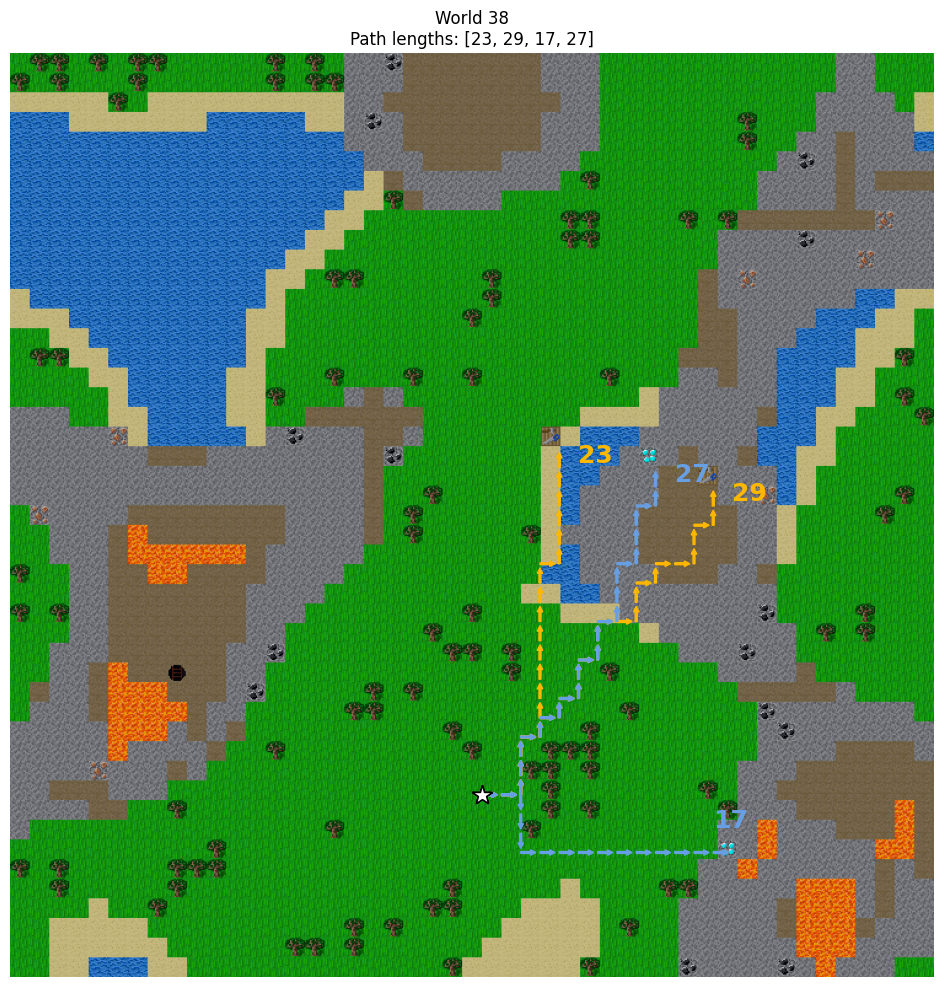

In [138]:
world_seed = 38
start_position = (38, 24)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_48_path_(26, 16)_(9, 44).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_48_path_(26, 16)_(9, 46).npy
path length: 46
path length: 48


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_48_path_(26, 16)_(32, 46).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_48_path_(26, 16)_(8, 43).npy
path length: 37
path length: 46
Saved to craftax_cache/0double/world_48_paths.png


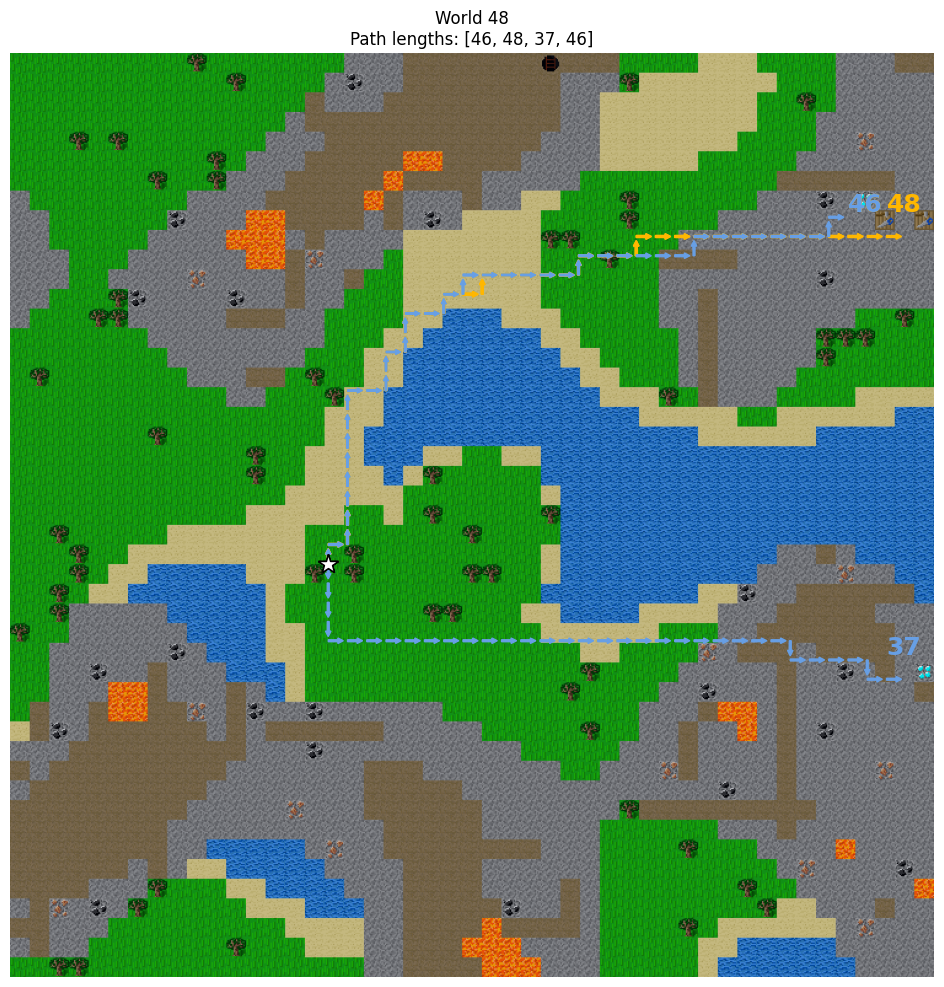

In [141]:
world_seed = 48
start_position = (26, 16)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )